In [87]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [88]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import obspy.io.segy.core as op
from scipy import signal

In [89]:
# Weak Signal
file = 'data/das/FORGE1/FORGE_78-32_iDASv3-P11_UTC190428070308.sgy'
stream = op._read_segy(file, format='segy')
noisy = np.vstack([trace.data for trace in stream])

print(noisy.shape)

noisy = noisy[200:960 + 200, 19500:20500]

# noisy = noisy[200:960 + 200, 19500:21500]
# noisy = signal.resample(noisy, 1000, axis=1)

noisy.shape

(1280, 30000)


(960, 1000)

In [90]:
# # Strong Signal
# file = 'data/das/FORGE1/FORGE_78-32_iDASv3-P11_UTC190423213209.sgy'
# stream = op._read_segy(file, format='segy')
# noisy = np.vstack([trace.data for trace in stream])

# # noisy = noisy[200:960 + 200, 1500:2500]

# noisy = noisy[200:960 + 200, 1500:3500]
# noisy = signal.resample(noisy, 1000, axis=1)

# noisy.shape

In [91]:
# # No Signal
# file = 'data/das/FORGE1/FORGE_78-32_iDASv3-P11_UTC190419001218.sgy'
# stream = op._read_segy(file, format='segy')
# noisy = np.vstack([trace.data for trace in stream])

# noisy = noisy[50:960 + 50, 7000:9000]
# noisy = signal.resample(noisy, 1000, axis=1)

# noisy.shape

In [92]:
noisy /= noisy.std()

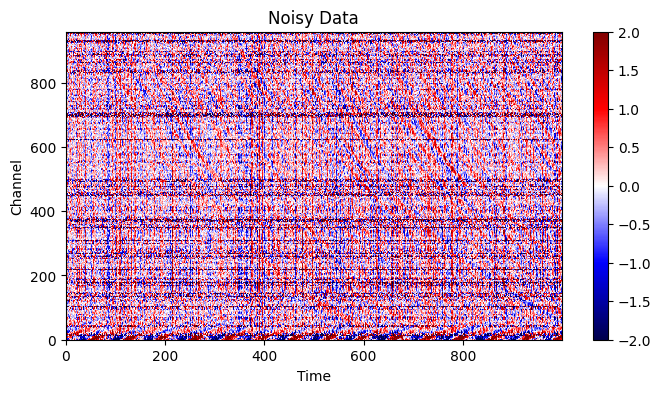

In [93]:
# clip = np.percentile(noisy, 99.)
clip = 2

plt.figure(figsize=(8, 4))
plt.imshow(noisy, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
plt.title('Noisy Data')
plt.xlabel('Time')
plt.ylabel('Channel')
plt.colorbar()
plt.show()

In [94]:
median = np.median(noisy, axis=0, keepdims=True)
pre_processed = noisy - median

In [95]:
from scipy.signal import butter, filtfilt

def lowpass(x, high, fs):
    band = 2 * high/fs
    b, a = butter(3, band, btype="low")
    x = filtfilt(b, a, x, axis=-1)

    return x


filtered = lowpass(pre_processed, 200, 1000)

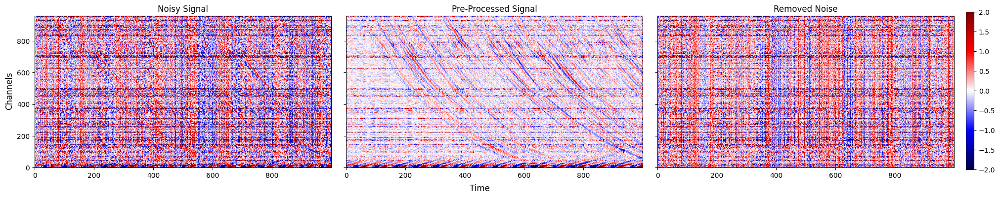

In [96]:
diff = noisy - filtered

# clip = np.percentile(noisy, 99.)
clip = 2

fig, axes = plt.subplots(1, 3, figsize=(24, 4), sharex=True, sharey=True)

im3 = axes[0].imshow(noisy, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[0].set_title('Noisy Signal')

axes[1].imshow(filtered, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[1].set_title('Pre-Processed Signal')

axes[2].imshow(diff, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[2].set_title('Removed Noise')

fig.supxlabel('Time', y=-0.02)
fig.supylabel('Channels', x=0.1)

cbar = fig.colorbar(im3, ax=axes, orientation='vertical', fraction=0.01)
cbar.ax.set_position([0.91, 0.1, 0.2, 0.8])

plt.subplots_adjust(wspace=0.05)
plt.show()

In [97]:
# filtered = pre_processed.copy()

In [98]:
# # local normalization
# from scipy.ndimage import uniform_filter

# patch_size = 32

# local_mean = uniform_filter(filtered, size=patch_size) 
# local_var = uniform_filter(filtered**2, size=patch_size) - local_mean**2

# local_std = np.sqrt(np.maximum(local_var, 0))  # Ensure non-negative variance

# normalized = (filtered - 0) / (local_std + 1e-8)

In [99]:
from scipy.ndimage import uniform_filter1d

k = 32

local_mean = uniform_filter1d(filtered, size=k, axis=1, mode='nearest')

# Compute row-wise local variance and standard deviation
local_var = uniform_filter1d(filtered**2, size=k, axis=1, mode='nearest') - local_mean**2
local_std = np.sqrt(np.maximum(local_var, 0))  # Ensure non-negative variance

# Normalize the image: (I - local_mean) / (local_std + epsilon)
normalized = (filtered - 0) / (local_std + 1e-8)

In [100]:
# k = 32
# l = 4

# # Step 1: Apply a row-wise (1xk) uniform filter along columns
# local_mean = uniform_filter1d(pre_processed, size=k, axis=1, mode='nearest')

# # Step 2: Apply a column-wise (3x1) uniform filter along rows
# local_mean = uniform_filter1d(local_mean, size=l, axis=0, mode='nearest')

# # Compute local variance
# local_var = uniform_filter1d(pre_processed**2, size=k, axis=1, mode='nearest')
# local_var = uniform_filter1d(local_var, size=l, axis=0, mode='nearest')
# local_var -= local_mean**2

# # Compute local standard deviation
# local_std = np.sqrt(np.maximum(local_var, 0))  # Ensure non-negative variance

# # Normalize the image: (I - local_mean) / (local_std + epsilon)
# normalized= (pre_processed - 0) / (local_std + 1e-8)

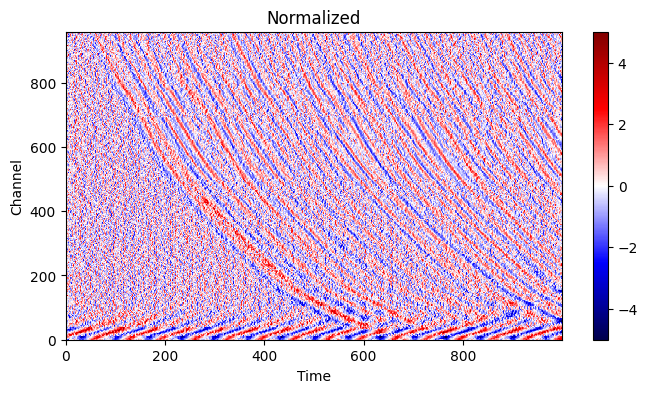

In [101]:
clip = 5
# clip = np.percentile(noisy, 99.)

plt.figure(figsize=(8, 4))
plt.imshow(normalized, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
plt.title('Normalized')
plt.xlabel('Time')
plt.ylabel('Channel')
plt.colorbar()
plt.show()

In [47]:
y = torch.Tensor(normalized.copy()).unsqueeze(0).unsqueeze(0)

In [48]:
from models import UNetModECA, UNetMod, FC_ECA, FC_ECA1
from denoisers.dip import DIP, SGDIP, PatchDIP, losses, schedules, DDIP

# architectures
net = UNetMod(in_ch=1, out_ch=1, hidden_ch=8, n_layers=4)
net1 = UNetModECA(in_ch=1, out_ch=1, hidden_ch=8, n_layers=4)

# schedules
linear_1_10 = schedules.Linear(1, 10)
linear_1_2 = schedules.Linear(1, 2)
linear_1_5 = schedules.Linear(1, 5)
cos_1_5 = schedules.Cos(0.1, 0.9)

# losses
mse = losses.MSE()
nmse = losses.NMSE()
mse_ae = losses.Compose(mse, losses.AE())
nmse_ae = losses.Compose(nmse, losses.AE())
mse_ae_ip = losses.Interpolate(mse, losses.AE())
mse_tv = losses.Compose(mse, losses.TV(), 0.3)

options = {
    "mode": "local",
    "config": {
        "out_dir": "output/das",
        "project": "",
        "entity": "",
        "group": "",
        "dataset": "",
        "denoiser_id": 0,
        "data_id": 0,
    },
    "metrics": {},
    "log_output": False,
}

Running: 0 - SGDIP (k=3, r=0.5, ref=False) - MSE + AE (alpha=1) - UNetMod ECA 


100%|██████████| 300/300 [01:32<00:00,  3.25it/s]


Summary: {'runtime': '00:01:32'}



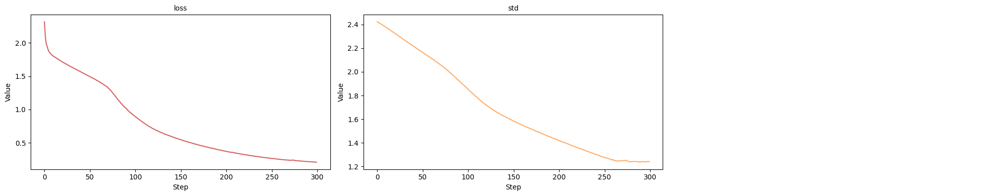

In [ ]:
sgdip = SGDIP(net1, mse_ae, max_epochs=500, ratio=0.5, use_ref=False)  # .with_alpha(schedules.Linear(1, 10))
# sgdip = DIP(net1, mse_tv, max_epochs=1000, early_stopping=False)

x_hat, _, _ = sgdip.denoise(y, logging_options=options, init_state={"reference": y}) # , init_state={"reference": y}
x_hat = x_hat.detach().clone().cpu()

In [50]:
# Rescale
denoised = x_hat.clone().squeeze().numpy()

denoised = denoised*local_std #+ local_mean

diff = noisy - denoised

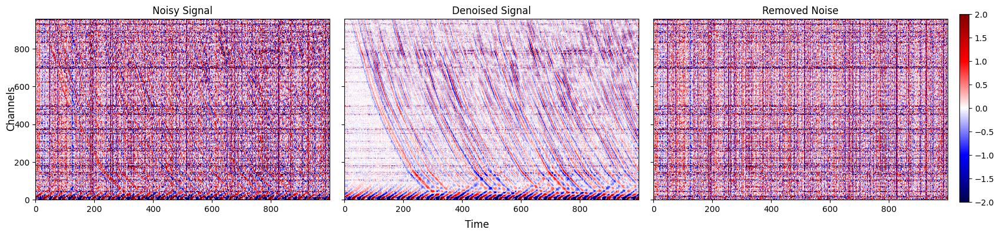

In [51]:
clip = 2

fig, axes = plt.subplots(1, 3, figsize=(20, 4), sharex=True, sharey=True)

im1 = axes[0].imshow(noisy, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[0].set_title('Noisy Signal')

axes[1].imshow(denoised, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[1].set_title('Denoised Signal')

axes[2].imshow(diff, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[2].set_title('Removed Noise')

fig.supxlabel('Time', y=-0.02)
fig.supylabel('Channels', x=0.1)

cbar = fig.colorbar(im1, ax=axes, orientation='vertical', fraction=0.01)
cbar.ax.set_position([0.91, 0.1, 0.2, 0.8])

plt.subplots_adjust(wspace=0.05)
plt.show()

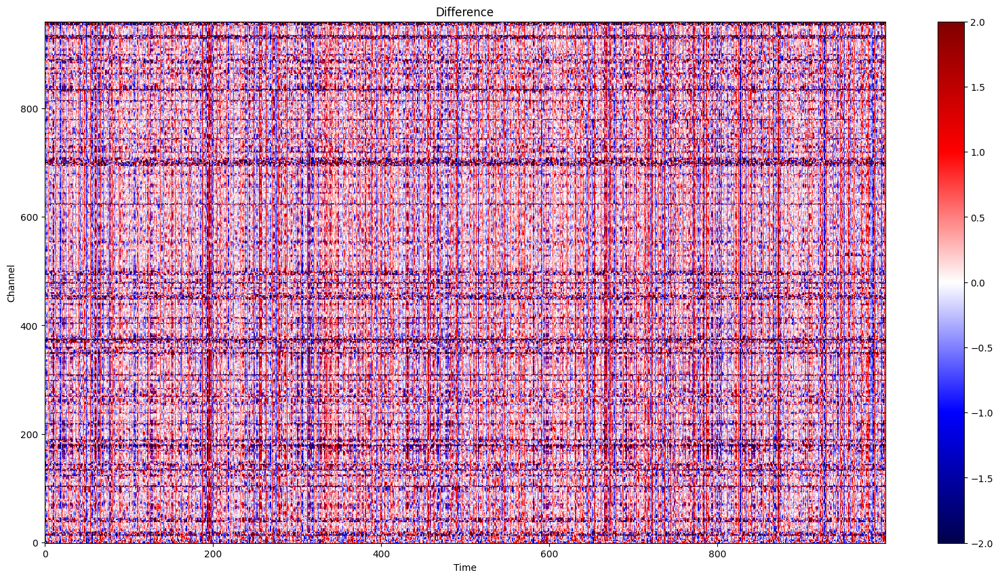

In [52]:
diff = noisy - denoised

clip = 2
plt.figure(figsize=(20, 10))
plt.imshow(diff, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
plt.title('Difference')
plt.xlabel('Time')
plt.ylabel('Channel')
plt.colorbar()
plt.show()

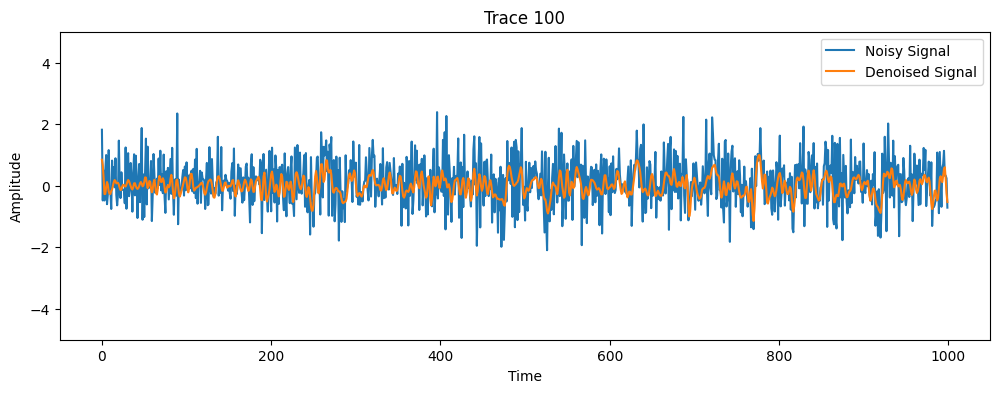

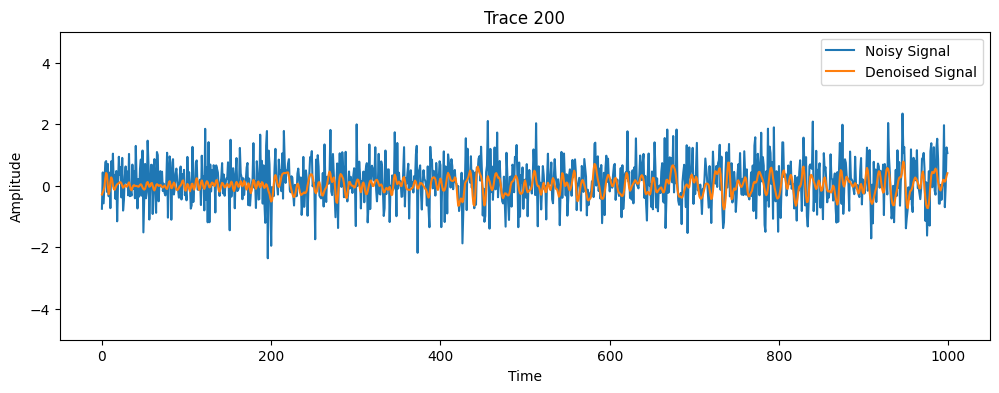

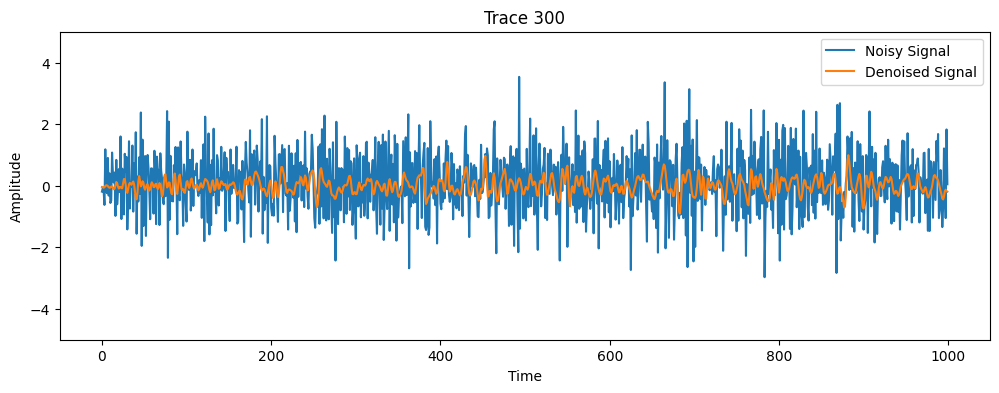

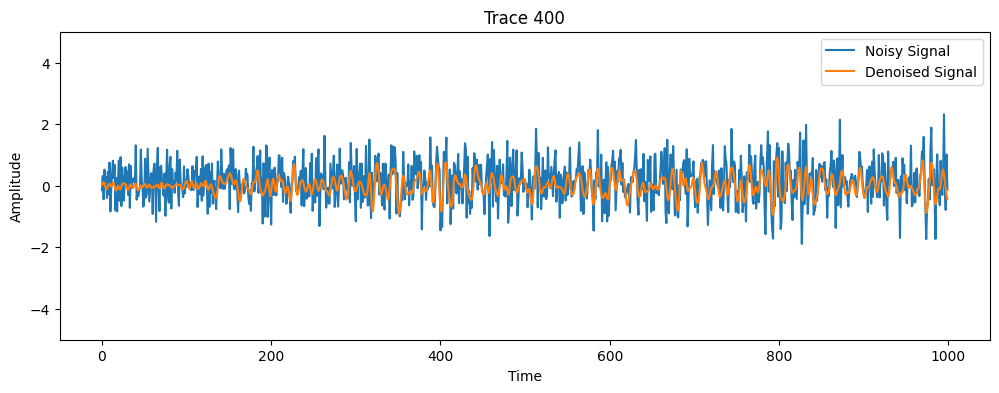

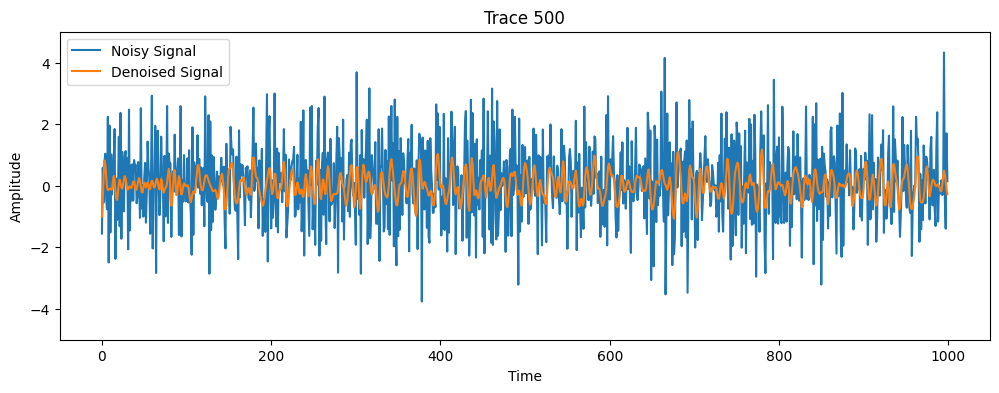

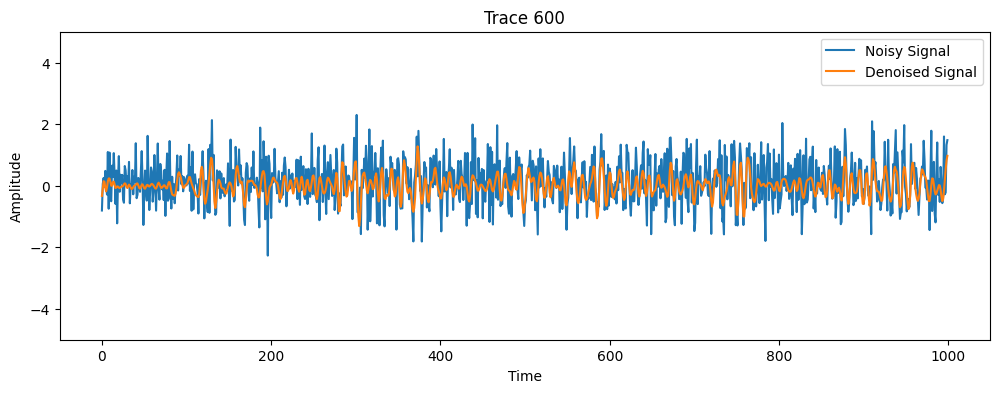

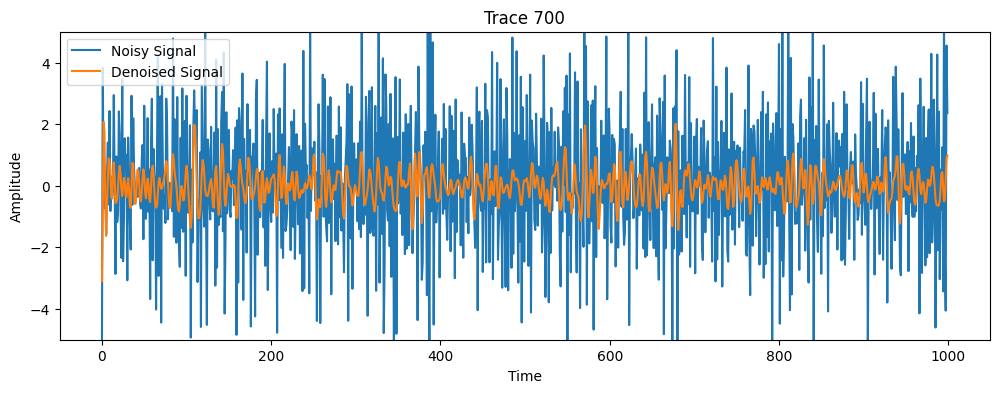

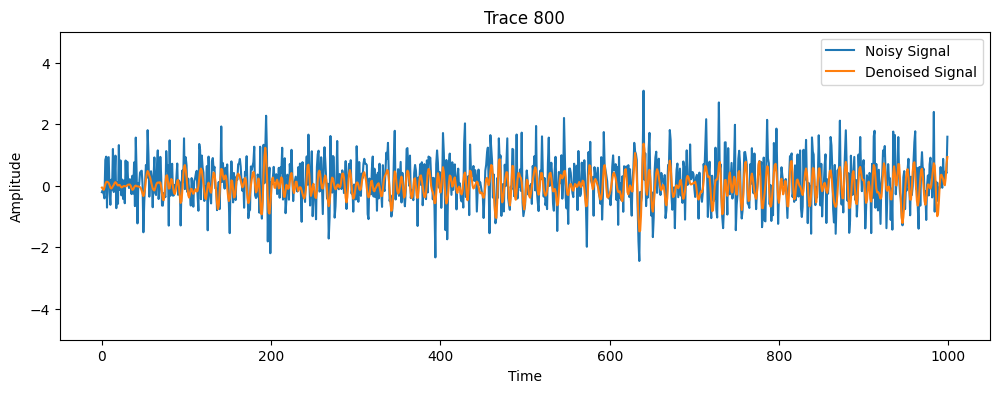

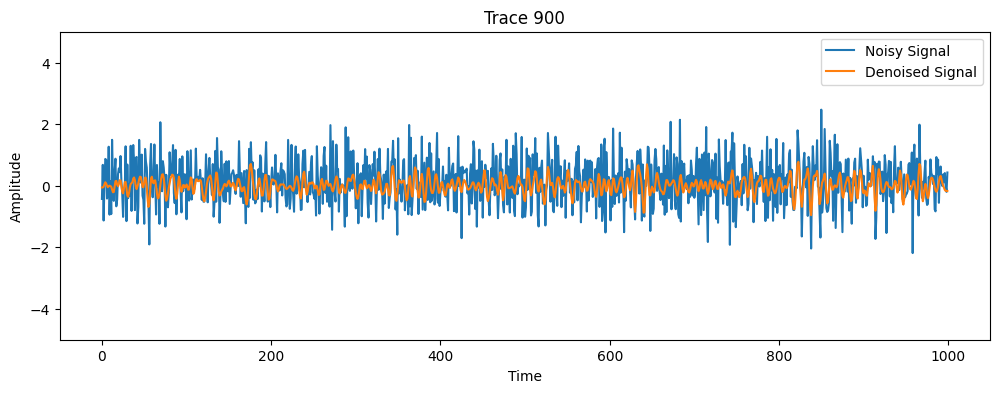

In [53]:
from scipy.ndimage import gaussian_filter1d

channels = [i for i in range(100, 1000, 100)]

for channel in channels:
    denoised_trace = denoised[channel, :]
    noisy_trace = noisy[channel, :]
    # smoothed = gaussian_filter1d(noisy_trace, sigma=2)

    plt.figure(figsize=(12, 4))
    plt.plot(noisy_trace, label='Noisy Signal')
    # plt.plot(smoothed, label='Smoothed Noisy Signal')
    plt.plot(denoised_trace, label='Denoised Signal')
    plt.title(f'Trace {channel}')
    plt.ylabel('Amplitude')
    plt.xlabel('Time')
    plt.ylim(-5, 5)
    plt.legend()
    plt.show()

In [54]:
import pyseistr as ps

# BP
idf = ps.bandpassc(noisy.T, 0.001, 0, 200, 6, 6, 0, 0)

## SOMF
dip = ps.dip2dc(idf, 2, 10, 2, 0.01, 1, 0.000001, [50,50,1], 1)
idf = ps.somf2dc(idf, dip, 8, 2, 0.01, 1)

## FK
idf = idf - ps.fkdip(idf, 0.02)

# idf = idf - np.median(idf, axis=1, keepdims=True)

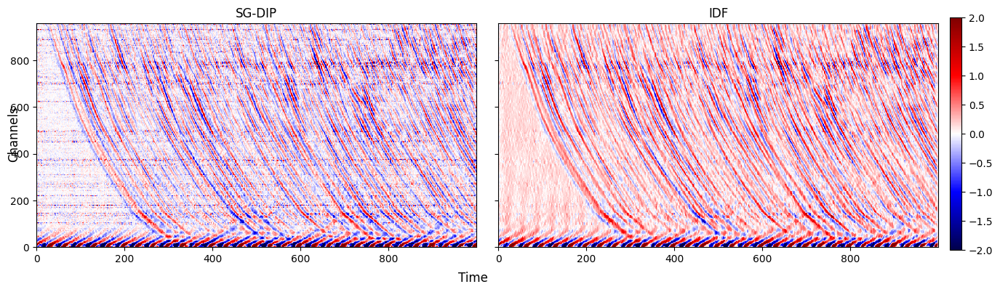

In [55]:
clip = 2

fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharex=True, sharey=True)

im1 = axes[0].imshow(denoised, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[0].set_title('SG-DIP')

axes[1].imshow(idf.T, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
axes[1].set_title('IDF')

fig.supxlabel('Time', y=-0.02)
fig.supylabel('Channels', x=0.1)

cbar = fig.colorbar(im1, ax=axes, orientation='vertical', fraction=0.01)
cbar.ax.set_position([0.91, 0.1, 0.2, 0.8])

plt.subplots_adjust(wspace=0.05)
plt.show()

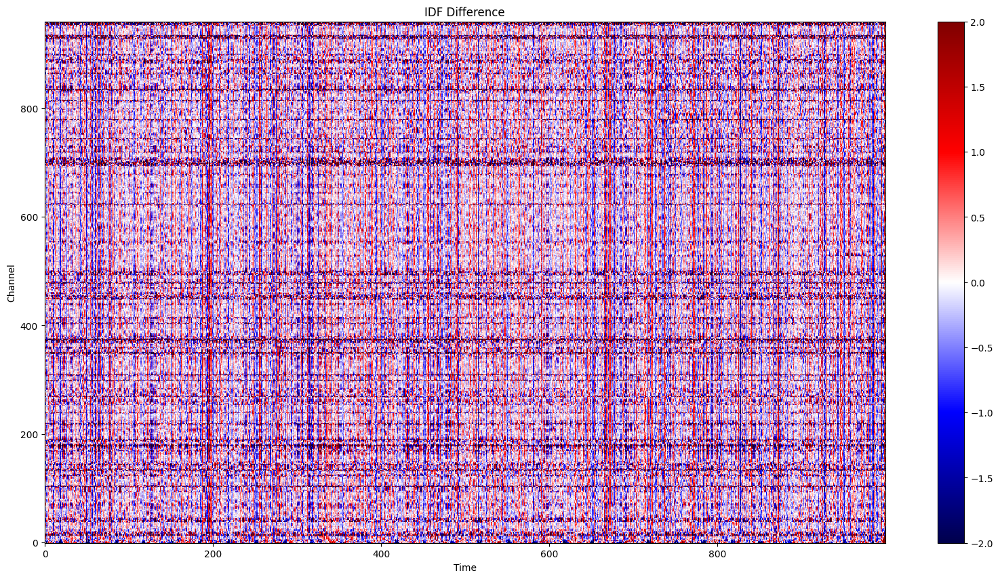

In [56]:
diff = noisy - idf.T

clip = 2
plt.figure(figsize=(20, 10))
plt.imshow(diff, origin='lower', aspect='auto', cmap='seismic', interpolation='none', vmin=-clip, vmax=clip)
plt.title('IDF Difference')
plt.xlabel('Time')
plt.ylabel('Channel')
plt.colorbar()
plt.show()

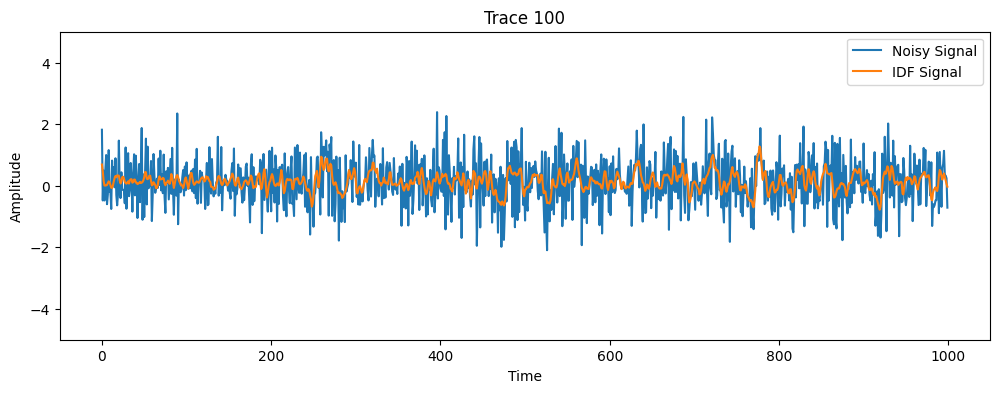

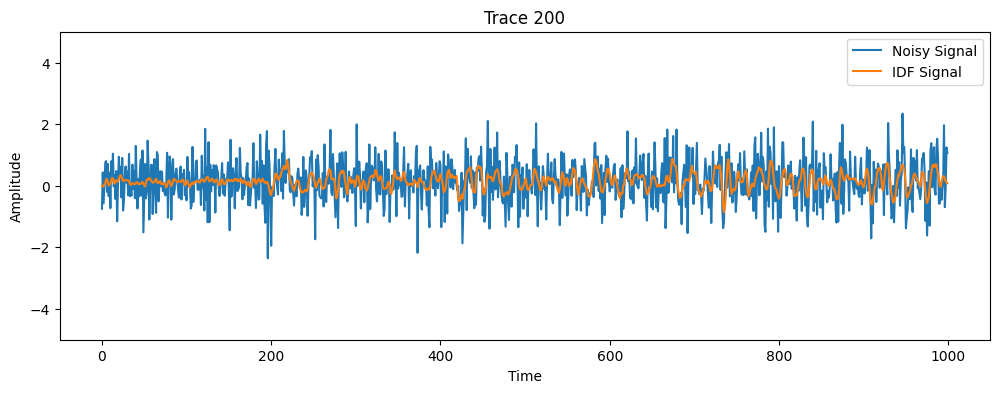

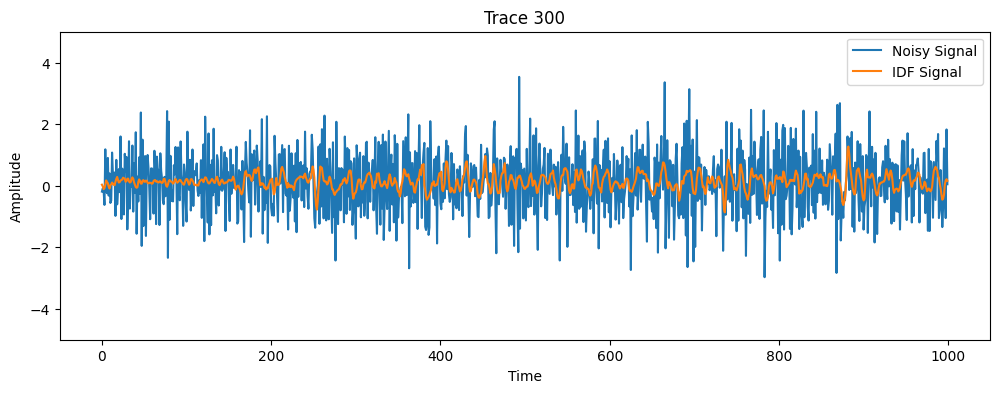

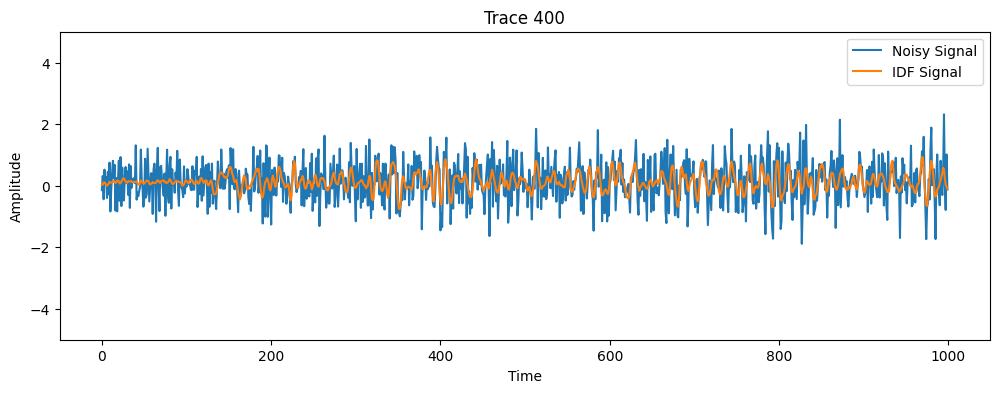

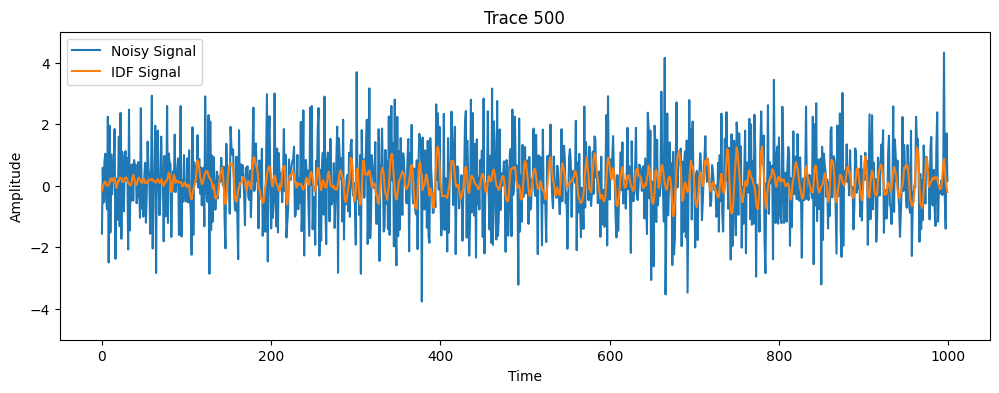

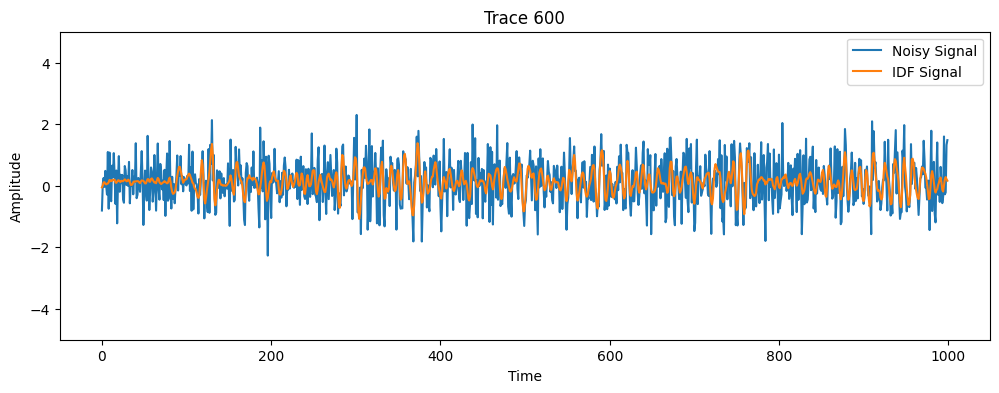

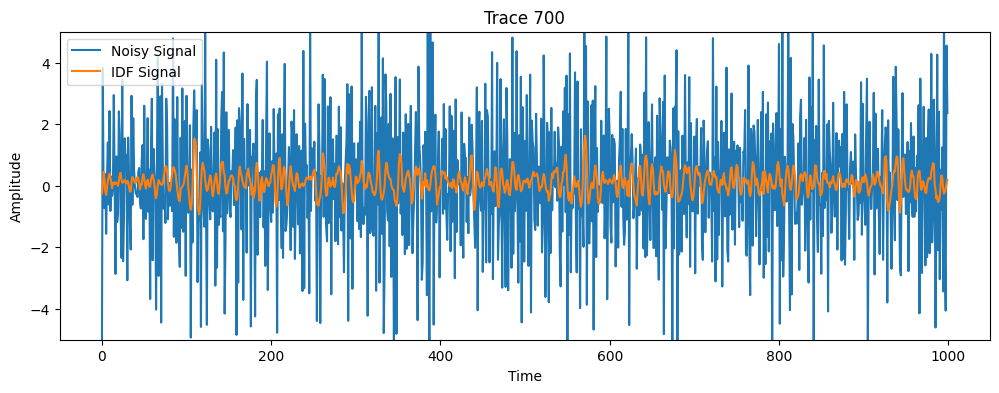

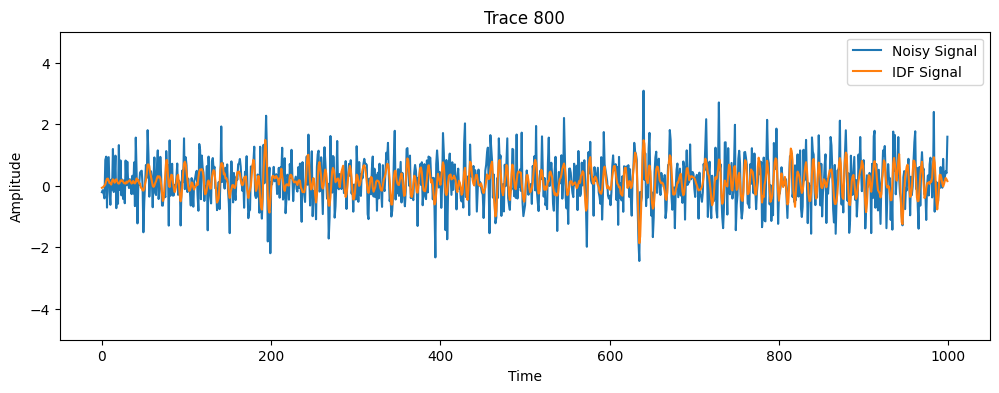

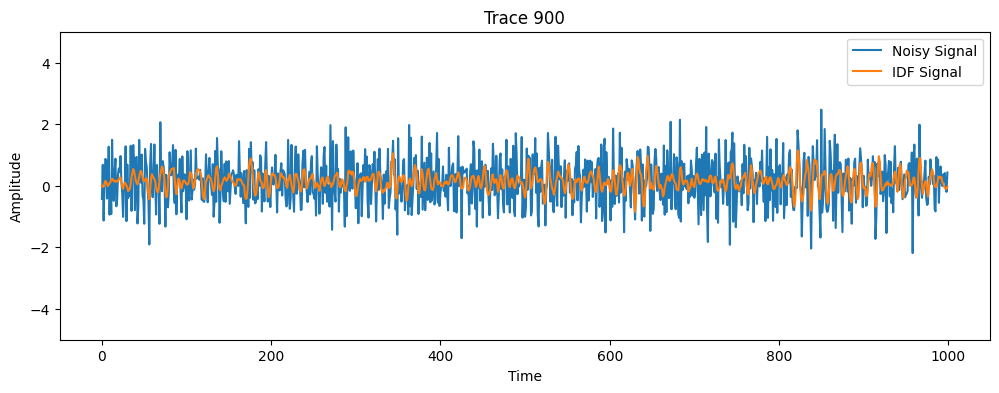

In [57]:
from scipy.ndimage import gaussian_filter1d

channels = [i for i in range(100, 1000, 100)]

for channel in channels:
    idf_trace = idf.T[channel, :]
    noisy_trace = noisy[channel, :]
    # smoothed = gaussian_filter1d(noisy_trace, sigma=2)

    plt.figure(figsize=(12, 4))
    plt.plot(noisy_trace, label='Noisy Signal')
    # plt.plot(smoothed, label='Smoothed Noisy Signal')
    plt.plot(idf_trace, label='IDF Signal')
    plt.title(f'Trace {channel}')
    plt.ylabel('Amplitude')
    plt.xlabel('Time')
    plt.ylim(-5, 5)
    plt.legend()
    plt.show()

In [58]:
def xcorr(x, y):
    
    # FFT of x and conjugation
    X_bar = np.fft.rfft(x).conj()
    Y = np.fft.rfft(y)
    
    # Compute norm of data
    norm_x_sq = np.sum(x**2)
    norm_y_sq = np.sum(y**2)
    norm = np.sqrt(norm_x_sq * norm_y_sq)
    
    # Correlation coefficients
    R = np.fft.irfft(X_bar * Y) / norm
    
    # Return correlation coefficient
    return np.max(R)

def compute_xcorr_window(x):
    Nch = x.shape[0]
    Cxy = np.zeros((Nch, Nch)) * np.nan
    
    for i in range(Nch):
        for j in range(i):
            Cxy[i, j] = xcorr(x[i], x[j])
    
    return np.nanmean(Cxy)

def compute_moving_coherence(data, bin_size):
    
    N_ch = data.shape[0]
    
    cc = np.zeros(N_ch)
    
    for i in range(N_ch):
        start = max(0, i - bin_size // 2)
        stop = min(i + bin_size // 2, N_ch)
        ch_slice = slice(start, stop)
        cc[i] = compute_xcorr_window(data[ch_slice])
        
    return cc

In [59]:
cc_noisy = compute_moving_coherence(noisy, 11)
cc_denoised = compute_moving_coherence(denoised, 11)
cc_idf = compute_moving_coherence(idf.T, 11)

cc_gain_sg = cc_denoised / cc_noisy
cc_gain_idf = cc_idf / cc_noisy

cc_gain_sg.shape

(960,)

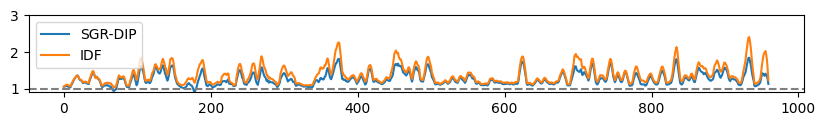

In [60]:
plt.figure(figsize=(10,1))
ax = plt.gca()
ax.set_ylim([0.9, 3])

plt.plot(cc_gain_sg, label="SGR-DIP")
plt.plot(cc_gain_idf, label="IDF")
plt.axhline(1, linestyle="dashed", color="gray")
plt.legend()
plt.show()

In [61]:
# np.save('no_noisy.npy', noisy)
# np.save('strong_sg_without.npy', denoised)
# np.save('no_idf.npy', idf.T)

In [62]:
# np.save('moderate_noisy.npy', noisy)
# np.save('moderate_dip.npy', denoised)
# np.save('moderate_idf.npy', idf.T)